In [1]:
import pandas as pd
import random
import numpy as np

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.preprocessing import LabelEncoder

ModuleNotFoundError: No module named 'seaborn'

## RECOPILACION DE DATOS
- Fuentes:
    - Kaggle: https://www.kaggle.com/datasets
        - Base de datos.

    - Psy-Dass: http://www2.psy.unsw.edu.au/dass/ 
        - Tanto los datos de como interpretar el dass como información acerca del ámbito psicológico.

        
    - Psy-Tipi: https://gosling.psy.utexas.edu/scales-weve-developed/ten-item-personality-measure-tipi/
        - Información sobre el 10-item personality inventory y como hacer el calculo de los tipos de personalidad.


    - ChatGPT: https://chatgpt.com/ 
        - Ayuda para encontrar los manuales de interpretación del Dass y diferentes fuentes referentes al mundo de la psicología.

## CALCULOS DE 10-ITEM PERSONALITY INVENTORY

- *RESPUESTAS DE TIPI:*

    - 1 = Disagree strongly               
    - 2 = Disagree moderately             
    - 3 = Disagree a little               
    - 4 = Neither agree nor disagree              
    - 5 = Agree a little              
    - 6 = Agree moderately                
    - 7 = Agree strongly              


- *CALCULO DEL TIPI:*        

    - **Extraversión**: TIPI1, TIPI6 (invertido)              
    - **Agradabilidad**: TIPI2 (invertido), TIPI7             
    - **Conciencia**: TIPI3, TIPI8 (invertido)                
    - **Neuroticismo**: TIPI4 (invertido), TIPI9              
    - **Apertura a la experiencia**: TIPI5, TIPI10 (invertido)

## CALCULO DEL DASS

- **Depresión:**  Q3, Q5, Q10, Q13, Q16, Q17, Q21, Q24, Q26, Q31, Q34, Q37, Q38, Q42    

- **Ansiedad:**   Q2, Q4, Q7, Q9, Q15, Q19, Q20, Q23, Q25, Q28, Q30, Q36, Q40, Q41      
                                                                                
- **Estrés:**     Q1, Q6, Q8, Q11, Q12, Q14, Q18, Q22, Q27, Q29, Q32, Q33, Q35, Q39






|               | *Depresión* |  *Ansiedad*   | *Estrés*    |   
|---------------|-------------|---------------|-------------|                       
| **Normal**    |    0-9      |     0-7       |   0-14      |
| **Mild**      |    10-13    |     8-9       |   15-18     |
| **Moderate**  |    14-20    |     10-14     |   19-25     |
| **Severe**    |    21-27    |     15-19     |   26-33     |
| **Severe++**  |    28+      |     20+       |   34+       |


In [7]:
df = pd.read_csv(r'encuesta.csv', delimiter=r'\s+', engine='python', on_bad_lines='skip')
print(df.shape)
df.head()

(30007, 172)


,Q1A,Q1I,Q1E,Q2A,Q2I,Q2E,Q3A,Q3I,Q3E,Q4A,...,screensize,uniquenetworklocation,hand,religion,orientation,race,voted,married,familysize,major
0,4,28,3890,4,25,2122,2,16,1944,4,...,1,1,1,12,1,10,2,1,2,None
1,4,2,8118,1,36,2890,2,35,4777,3,...,2,1,2,7,0,70,2,1,4,None
2,3,7,5784,1,33,4373,4,41,3242,1,...,2,1,1,4,3,60,1,1,3,None
3,2,23,5081,3,11,6837,2,37,5521,1,...,2,1,2,4,5,70,2,1,5,biology
4,2,36,3215,2,13,7731,3,5,4156,4,...,2,2,3,10,1,10,2,1,4,Psychology


## EDA

In [8]:
#Separacion de datos en distintos DFs para poder trabajar con ellos

preguntas = df.iloc[:, :126]    #Cuestionario del DASS

tipi = df.iloc[:, 131:141]      #10-items personality inventory

lapse = df.iloc[:, 126:131]     #columna de tiempo que se tarda en responder la encuesta

vlc = df.iloc[:, 141:157]       #palabras para evaluación cognitiva, dentro de contexto educativo y de atención al cuestionario

demograficos = df.iloc[:, 157:] #datos demográficos


In [9]:
#Separamos los Q y nos quedamos con QA que son las respuestas al cuestionario

listaA = []
for n in range(1, 43):
    numero = f'Q{n}I'
    listaA.append(numero)
QA = preguntas.drop(listaA, axis=1)

listaI = []
for n in range(1, 43):
    numero = f'Q{n}A'
    listaI.append(numero)
QE = QA.drop(listaI, axis=1)

listaE = []
for n in range(1, 43):
    numero = f'Q{n}E'
    listaE.append(numero)
QA=QA.drop(listaE,axis=1)

#Añado QE a lapse, por si se utiliza despues
lapse=pd.concat([lapse,QE],axis=1)


In [10]:
def separarQA(lista,df):
    lista_vacia=[]

    for n in lista:
        numero = f'Q{n}A'
        lista_vacia.append(numero)
        nuevo_QA=df[lista_vacia]

    return nuevo_QA

In [11]:
#Separamos los QA en el tipo de calculo que realizan

anxiety_list=[ 2, 4, 7, 9, 15, 19, 20, 23, 25, 28, 30, 36, 40, 41]
depression_list=[3, 5, 10, 13, 16, 17, 21, 24, 26, 31, 34, 37, 38, 42]
stress_list= [1, 6, 8, 11, 12, 14, 18, 22, 27, 29, 32, 33, 35, 39]

Anxiety=separarQA(anxiety_list,QA)
Depression=separarQA(depression_list,QA)
Stress=separarQA(stress_list,QA)

Anxiety.head(2)
print(Anxiety.shape,Depression.shape,Stress.shape)

(30007, 14) (30007, 14) (30007, 14)


In [12]:
#Añadimos a QA la columna de calculo de estrés/ansiedad/depresión
#el cálculo se realiza sumando los valores de las preguntas y restando 14
#(el cuestionario debería ser con valores de 0-3, pero al estar de 1-4 hacemos esto para un mejor calculo)
# el cálculo se realiza siguiendo las instrucciones de los datos oficiales del inventario de ansiedad de Beck

QA['Suma Estrés']=((Stress.sum(axis=1))-14)
QA['Suma Depresión']=((Depression.sum(axis=1))-14)
QA['Suma Ansiedad']=((Anxiety.sum(axis=1))-14)

QA.head(2)

,Q1A,Q2A,Q3A,Q4A,Q5A,Q6A,Q7A,Q8A,Q9A,Q10A,...,Q36A,Q37A,Q38A,Q39A,Q40A,Q41A,Q42A,Suma Estrés,Suma Depresión,Suma Ansiedad
0,4,4,2,4,4,4,4,4,2,1,...,4,1,2,4,3,4,4,40,27,34
1,4,1,2,3,4,4,3,4,3,2,...,3,4,2,2,1,2,2,27,24,17


In [13]:
#Valoración del grado de ansiedad/estres/depresión según los datos oficiales del inventario de ansiedad de Beck

valoracion=[]
for n in QA['Suma Depresión']:

    if n <=9:
        valoracion.append('Ninguna')
    elif n in range(10,14):
        valoracion.append('Muy leve')
    elif n in range(14,21):
        valoracion.append('Leve / Moderada')
    elif n in range(21,28):
        valoracion.append('Importante')
    elif n >= 28:
        valoracion.append('Grave')
    else: valoracion.append('Error de conteo')

QA['Valoracion Depresión']=(valoracion)



valoracion=[]
for n in QA['Suma Ansiedad']:

    if n <=7:
        valoracion.append('Ninguna')
    elif n in range(8,10):
        valoracion.append('Muy leve')
    elif n in range(10,15):
        valoracion.append('Leve / Moderada')
    elif n in range(15,20):
        valoracion.append('Importante')
    elif n >= 20:
        valoracion.append('Grave')
    else: valoracion.append('Error de conteo')

QA['Valoracion Ansiedad']=(valoracion)



valoracion=[]
for n in QA['Suma Estrés']:

    if n <=14:
        valoracion.append('Ninguna')
    elif n in range(15,19):
        valoracion.append('Muy leve')
    elif n in range(19,26):
        valoracion.append('Leve / Moderada')
    elif n in range(26,34):
        valoracion.append('Importante')
    elif n >= 34:
        valoracion.append('Grave')
    else: valoracion.append('Error de conteo')

QA['Valoracion Estrés']=(valoracion)


QA.head(2)

,Q1A,Q2A,Q3A,Q4A,Q5A,Q6A,Q7A,Q8A,Q9A,Q10A,...,Q39A,Q40A,Q41A,Q42A,Suma Estrés,Suma Depresión,Suma Ansiedad,Valoracion Depresión,Valoracion Ansiedad,Valoracion Estrés
0,4,4,2,4,4,4,4,4,2,1,...,4,3,4,4,40,27,34,Importante,Grave,Grave
1,4,1,2,3,4,4,3,4,3,2,...,2,1,2,2,27,24,17,Importante,Importante,Importante


In [14]:
QA.describe().round(2)

,Q1A,Q2A,Q3A,Q4A,Q5A,Q6A,Q7A,Q8A,Q9A,Q10A,...,Q36A,Q37A,Q38A,Q39A,Q40A,Q41A,Q42A,Suma Estrés,Suma Depresión,Suma Ansiedad
count,30007.00,30007.00,30007.00,30007.00,30007.00,30007.00,30007.00,30007.00,30007.00,30007.00,...,30007.00,30007.00,30007.00,30007.00,30007.00,30007.00,30007.00,30007.00,30007.00,30007.00
mean,2.64,2.17,2.25,1.97,2.55,2.56,1.95,2.50,2.68,2.47,...,2.28,2.39,2.42,2.48,2.67,1.99,2.71,21.40,21.36,16.28
std,1.03,1.11,1.05,1.05,1.07,1.05,1.05,1.06,1.07,1.14,...,1.11,1.15,1.19,1.02,1.11,1.06,1.04,10.56,12.38,10.35
min,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,...,1.00,1.00,1.00,1.00,1.00,1.00,1.00,0.00,0.00,0.00
25%,2.00,1.00,1.00,1.00,2.00,2.00,1.00,2.00,2.00,1.00,...,1.00,1.00,1.00,2.00,2.00,1.00,2.00,13.00,11.00,8.00
50%,3.00,2.00,2.00,2.00,2.00,2.00,2.00,2.00,3.00,2.00,...,2.00,2.00,2.00,2.00,3.00,2.00,3.00,21.00,21.00,15.00
75%,4.00,3.00,3.00,3.00,4.00,4.00,3.00,3.00,4.00,4.00,...,3.00,4.00,4.00,3.00,4.00,3.00,4.00,30.00,32.00,24.00
max,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,...,4.00,4.00,4.00,4.00,4.00,4.00,4.00,42.00,42.00,42.00


In [15]:
df=tipi

# Invertimos los tipis negativos y calculamos la media de los tipis para cada rasgo de personalidad

df['TIPI6'] = 8 - df['TIPI6']
df['TIPI2'] = 8 - df['TIPI2']
df['TIPI8'] = 8 - df['TIPI8']
df['TIPI4'] = 8 - df['TIPI4']
df['TIPI10'] = 8 - df['TIPI10']

df['Extraversión'] = df[['TIPI1', 'TIPI6']].mean(axis=1)
df['Amabilidad'] = df[['TIPI2', 'TIPI7']].mean(axis=1)
df['Responsabilidad'] = df[['TIPI3', 'TIPI8']].mean(axis=1)
df['Neuroticismo'] = df[['TIPI4', 'TIPI9']].mean(axis=1)
df['Apertura exp'] = df[['TIPI5', 'TIPI10']].mean(axis=1)

df.head(2)

,TIPI1,TIPI2,TIPI3,TIPI4,TIPI5,TIPI6,TIPI7,TIPI8,TIPI9,TIPI10,Extraversión,Amabilidad,Responsabilidad,Neuroticismo,Apertura exp
0,1,3,7,1,7,1,7,3,1,7,1.0,5.0,5.0,1.0,7.0
1,6,3,4,1,5,4,7,1,1,3,5.0,5.0,2.5,1.0,4.0


In [16]:
#Renombramos las columnas de df solo para la propia comprensión a la hora de saber el significado de los datos

df.columns = [
    'Extrovertido, entusiasta',
    'Criticón, peleón',
    'Confiable, con autocontrol',
    'Ansioso, irascible',
    'Abierto a nuevas experiencias, intereses complejos',
    'Reservado, callado',
    'Simpático, cálido',
    'Desorganizado, descuidado',
    'Calmado, emocionalmente estable',
    'Convencional, poco creativo',
    'EXTRAVERSIÓN',
    'AMABILIDAD',
    'RESPONSABILIDAD',
    'NEUROTICISMO',
    'APERTURA EXP']

df.head(2)

,"Extrovertido, entusiasta","Criticón, peleón","Confiable, con autocontrol","Ansioso, irascible","Abierto a nuevas experiencias, intereses complejos","Reservado, callado","Simpático, cálido","Desorganizado, descuidado","Calmado, emocionalmente estable","Convencional, poco creativo",EXTRAVERSIÓN,AMABILIDAD,RESPONSABILIDAD,NEUROTICISMO,APERTURA EXP
0,1,3,7,1,7,1,7,3,1,7,1.0,5.0,5.0,1.0,7.0
1,6,3,4,1,5,4,7,1,1,3,5.0,5.0,2.5,1.0,4.0


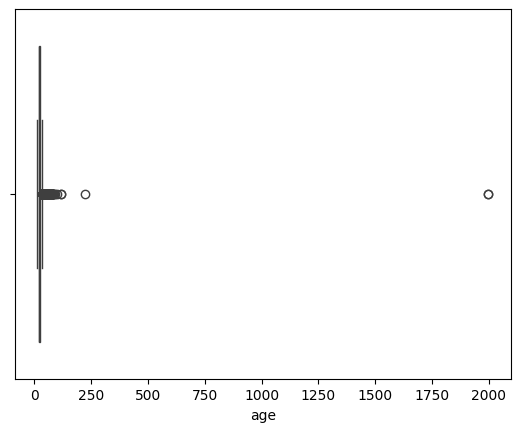

In [17]:
#Empezamos el estudio con la columna edad

sns.boxplot(data = demograficos, x='age')
plt.show()

In [18]:
#Quitamos oulayers

media_edad = demograficos.loc[demograficos['age'] < 85, 'age'].mean()

demograficos.loc[demograficos['age'] >= 85, 'age'] = media_edad

demograficos['age']=demograficos['age'].astype(int)
demograficos['age'].describe()

C:\Users\Jesús\AppData\Local\Temp\ipykernel_4684\400306426.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '23.178005933531118' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  demograficos.loc[demograficos['age'] >= 85, 'age'] = media_edad


count    30007.000000
mean        23.177958
std          8.884185
min         13.000000
25%         18.000000
50%         21.000000
75%         25.000000
max         82.000000
Name: age, dtype: float64

In [19]:
#Continuamos con género

demograficos['gender'].value_counts()

gender
2    22991
1     6481
3      479
0       56
Name: count, dtype: int64

In [20]:
#Tratamos los outlayers de genero, quitamos los 0, que son valores invalidos y, para no borrar la fila
#lo reemplazamos por uno de los valores validos de manera aleatoria para no desvirtuar mucho los datos

demograficos['gender'] = demograficos['gender'].apply(lambda x: random.randint(1, 3) if x == 0 else x)

demograficos['gender'].unique()

array([2, 1, 3], dtype=int64)

In [21]:
#Continuamos con tamaño familia

demograficos['familysize'].value_counts()

familysize
2      7077
3      6963
4      5495
5      3479
1      2384
6      1732
0       931
7       896
8       501
9       247
10      139
11       75
12       45
13       15
14        6
16        5
15        4
17        3
23        1
21        1
19        1
24        1
62        1
26        1
65        1
54        1
99        1
133       1
Name: count, dtype: int64

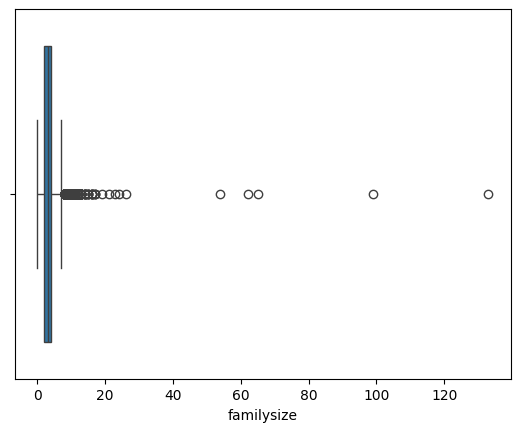

In [22]:
sns.boxplot(data = demograficos, x='familysize')
plt.show()

In [23]:
media_familiar = demograficos.loc[demograficos['familysize'] < 13, 'familysize'].mean()

demograficos.loc[demograficos['familysize'] >= 13, 'familysize'] = media_familiar

demograficos['familysize']=demograficos['familysize'].astype(int)

demograficos['familysize'].describe()

C:\Users\Jesús\AppData\Local\Temp\ipykernel_4684\3301847103.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '3.4191696702709917' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  demograficos.loc[demograficos['familysize'] >= 13, 'familysize'] = media_familiar


count    30007.000000
mean         3.418569
std          1.877246
min          0.000000
25%          2.000000
50%          3.000000
75%          4.000000
max         12.000000
Name: familysize, dtype: float64

In [24]:
#Borramos las columnas que no aportan nada

demograficos=demograficos.drop(['screensize','uniquenetworklocation'],axis=1)
demograficos.head(2)

,education,urban,gender,engnat,age,hand,religion,orientation,race,voted,married,familysize,major
0,2,3,2,2,16,1,12,1,10,2,1,2,None
1,2,3,2,1,16,2,7,0,70,2,1,4,None


In [25]:
# estandarizamos los valores de raza para que sea mas facil su lectura.
# 0=Other, 1=Asian, 2=Arab, 3=Black, 4=Indigenous Australian, 5=Native American, 6=White

demograficos['race'] = demograficos['race'].apply(lambda x: 1 if x == 10 else
                                                  2 if x == 20 else
                                                  3 if x == 30 else
                                                  4 if x == 40 else
                                                  5 if x == 50 else
                                                  6 if x == 60 else
                                                  0 if x == 70 else x)

demograficos.head(2)

,education,urban,gender,engnat,age,hand,religion,orientation,race,voted,married,familysize,major
0,2,3,2,2,16,1,12,1,1,2,1,2,None
1,2,3,2,1,16,2,7,0,0,2,1,4,None


In [26]:
#Limpiamos la columna major (estudios superiores de las personas)

conteos = demograficos['major'].value_counts()

valores_menos_de_100 = conteos[conteos < 100].index

demograficos['major'] = demograficos['major'].apply(lambda x: 0 if x in valores_menos_de_100 else x)

demograficos['major'].unique()

array([None, 0, 'Psychology', 'Art', 'Business', 'psychology', 'Biology',
       'History', 'Education', 'Architecture', nan, 'Marketing',
       'Engineering', 'Law', 'English', 'Accounting', 'Dentistry',
       'Nursing', 'medicine', 'IT', 'Communication', 'english',
       'Economics', 'Physics', 'engineering', 'Finance', 'Science',
       'Pharmacy', 'Management', 'law', 'business', 'Medicine',
       'Chemistry', 'Medical', 'Mathematics', 'accounting', 'Accountancy',
       'Tourism'], dtype=object)

In [27]:
#Englobamos las categorías para evitar la dispairdad de datos

categorias = {
    'ciencias': ['Biology', 'Physics', 'Chemistry', 'Science', 'Mathematics'],
    'medicina': ['Medicine', 'Dentistry', 'Nursing', 'Pharmacy', 'Medical', 'medicine'],
    'psicologia': ['Psychology', 'psychology'],
    'empresariales': ['Business', 'Marketing', 'Finance', 'Management', 'Accounting', 'accounting', 'Accountancy', 'business'],
    'ingenieria': ['Engineering', 'engineering'],
    'humanidades': ['History', 'English', 'english', 'Law', 'law', 'Communication'],
    'arte': ['Art', 'Architecture'],
    'tecnología': ['IT'],
    'turismo':['Tourism'],
    '0': [None, 0]}

In [28]:
#Hacemos un diccionario con las categorías

inverso_categorias = {}
for categoria, valores in categorias.items():
    for valor in valores:
        inverso_categorias[valor] = categoria

# Función de mapeo

def mapear_categoria(valor):
    return inverso_categorias.get(valor, '0')

# Aplicar la función de mapeo

demograficos['major'] = demograficos['major'].apply(mapear_categoria)

In [29]:
demograficos['major'].value_counts()

major
0                18652
empresariales     2745
humanidades       2366
psicologia        1779
medicina          1328
ciencias          1300
ingenieria        1093
arte               415
tecnología         209
turismo            120
Name: count, dtype: int64

In [30]:
#Reordenamos las columnas del data frame

orden=['Genero','Edad','Orientacion','Raza','Educacion','Licenciatura','Ingles Nativo','Religion','Matrimonio','Zurdo','Zona vivienda','Familia','Voto']

demograficos.columns=['Educacion','Zona vivienda','Genero','Ingles Nativo','Edad','Zurdo','Religion','Orientacion','Raza','Voto','Matrimonio','Familia','Licenciatura']
demograficos=demograficos[orden]

demograficos.head(2)

,Genero,Edad,Orientacion,Raza,Educacion,Licenciatura,Ingles Nativo,Religion,Matrimonio,Zurdo,Zona vivienda,Familia,Voto
0,2,16,1,1,2,0,2,12,1,1,3,2,2
1,2,16,0,0,2,0,1,7,1,2,3,4,2


In [31]:
#Creamos un nuevo df para utilizar para las visualizaciones, cogiendo los datos que nos interesan del resto de dfs.
#Más adelante, haremos un df con las etiquetas de los datos en lugar del código numérico para mejorar la visualización. 

visualizacion=pd.concat([QA.loc[:, ['Suma Estrés', 'Suma Ansiedad', 'Suma Depresión']], demograficos, tipi.loc[:,['EXTRAVERSIÓN','AMABILIDAD','RESPONSABILIDAD','NEUROTICISMO','APERTURA EXP']]],axis=1)

visualizacion.tail(5)

,Suma Estrés,Suma Ansiedad,Suma Depresión,Genero,Edad,Orientacion,Raza,Educacion,Licenciatura,Ingles Nativo,...,Matrimonio,Zurdo,Zona vivienda,Familia,Voto,EXTRAVERSIÓN,AMABILIDAD,RESPONSABILIDAD,NEUROTICISMO,APERTURA EXP
30002,14,2,6,2,27,1,6,4,psicologia,1,...,1,1,1,3,1,5.0,4.5,4.5,3.0,5.5
30003,30,21,15,2,16,1,0,1,0,1,...,1,1,2,3,2,5.5,4.0,5.0,4.0,3.5
30004,15,12,36,1,16,4,6,2,0,1,...,1,1,2,2,2,2.5,5.5,4.0,3.0,4.0
30005,34,34,38,1,21,0,1,3,0,2,...,1,1,2,4,2,3.0,3.5,3.0,2.5,4.0
30006,33,13,16,2,20,1,6,3,humanidades,1,...,1,1,2,2,1,2.0,2.5,4.0,2.0,3.5


In [32]:
visualizacion.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30007 entries, 0 to 30006
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Suma Estrés      30007 non-null  int64  
 1   Suma Ansiedad    30007 non-null  int64  
 2   Suma Depresión   30007 non-null  int64  
 3   Genero           30007 non-null  int64  
 4   Edad             30007 non-null  int32  
 5   Orientacion      30007 non-null  int64  
 6   Raza             30007 non-null  int64  
 7   Educacion        30007 non-null  int64  
 8   Licenciatura     30007 non-null  object 
 9   Ingles Nativo    30007 non-null  int64  
 10  Religion         30007 non-null  int64  
 11  Matrimonio       30007 non-null  int64  
 12  Zurdo            30007 non-null  int64  
 13  Zona vivienda    30007 non-null  int64  
 14  Familia          30007 non-null  int32  
 15  Voto             30007 non-null  int64  
 16  EXTRAVERSIÓN     30007 non-null  float64
 17  AMABILIDAD  

In [33]:
#Encodeamos la columna 'Licenciatura'

encoder=LabelEncoder()

visualizacion['Licenciatura']=encoder.fit_transform(visualizacion['Licenciatura'])


visualizacion.head(5)

,Suma Estrés,Suma Ansiedad,Suma Depresión,Genero,Edad,Orientacion,Raza,Educacion,Licenciatura,Ingles Nativo,...,Matrimonio,Zurdo,Zona vivienda,Familia,Voto,EXTRAVERSIÓN,AMABILIDAD,RESPONSABILIDAD,NEUROTICISMO,APERTURA EXP
0,40,34,27,2,16,1,1,2,0,2,...,1,1,3,2,2,1.0,5.0,5.0,1.0,7.0
1,27,17,24,2,16,0,0,2,0,1,...,1,2,3,4,2,5.0,5.0,2.5,1.0,4.0
2,17,12,39,2,17,3,6,2,0,2,...,1,1,3,3,1,2.0,4.0,2.5,4.5,5.5
3,16,17,16,2,13,5,0,1,0,1,...,1,2,3,5,2,2.5,6.5,7.0,5.0,6.5
4,29,40,32,2,19,1,1,3,7,2,...,1,3,2,4,2,2.5,4.0,2.5,2.5,5.0


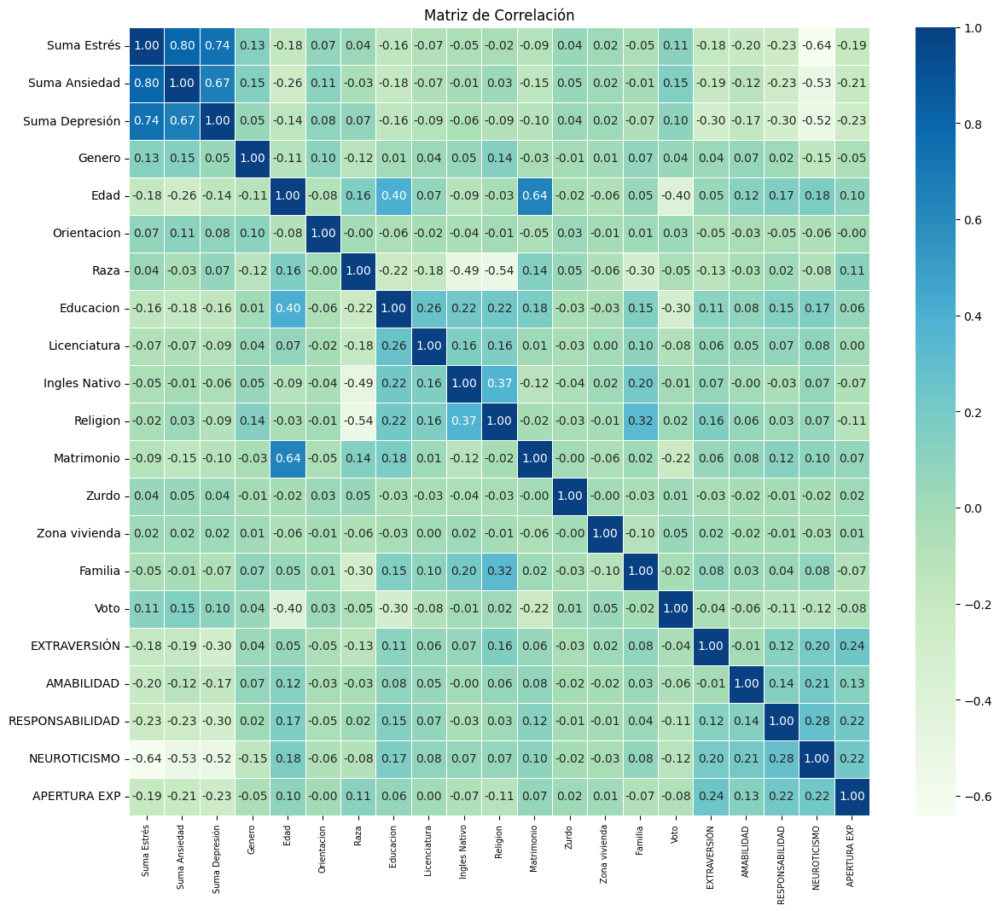

In [34]:
#Gráfico que muestra la correlación entre las distintas variables

correlation_matrix = visualizacion.corr()
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f',cmap='GnBu', linewidths=0.5)
plt.title('Matriz de Correlación')
plt.xticks(fontsize=7)
plt.show()

# PRUEBAS ALGORITMOS

In [35]:
#Importamos las librerías

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.utils import to_categorical

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, log_loss, roc_auc_score, classification_report, r2_score, root_mean_squared_error, mean_squared_error, mean_absolute_error

In [36]:
#Creamos los dfs con los 3 target: Estrés, Ansiedad y Depresión

df_estres=QA.drop(['Suma Estrés','Suma Depresión', 'Suma Ansiedad', 'Valoracion Depresión', 'Valoracion Ansiedad'],axis=1)
df_ansiedad=QA.drop(['Suma Depresión','Suma Ansiedad', 'Suma Estrés', 'Valoracion Depresión', 'Valoracion Estrés'],axis=1)
df_depresion=QA.drop(['Suma Estrés', 'Suma Ansiedad','Suma Depresión', 'Valoracion Ansiedad', 'Valoracion Estrés'],axis=1)

visualizacion_sin_columnas = visualizacion.drop(['Suma Estrés', 'Suma Ansiedad', 'Suma Depresión'], axis=1)

df_estres = pd.concat([df_estres, visualizacion_sin_columnas], axis=1)
df_ansiedad = pd.concat([df_ansiedad, visualizacion_sin_columnas], axis=1)
df_depresion = pd.concat([df_depresion, visualizacion_sin_columnas], axis=1)

encoder=LabelEncoder()
normalizador = StandardScaler()

In [37]:
#Estrés

df_estres['Valoracion Estrés']=encoder.fit_transform(df_estres['Valoracion Estrés'])

X_estres=np.array(df_estres.drop('Valoracion Estrés', axis=1))
y_estres=np.array(df_estres['Valoracion Estrés'])

X_estres = normalizador.fit_transform(X_estres)

X_train_estres, X_test_estres, y_train_estres, y_test_estres = train_test_split(X_estres,y_estres, test_size=0.25,random_state=42)


In [38]:
modelLR=LogisticRegression(solver='lbfgs',max_iter=200)

modelLR.fit(X_train_estres,y_train_estres)

y_pred_estres = modelLR.predict(X_test_estres)
y_pred_prob_estres = modelLR.predict_proba(X_test_estres)

accuracy_estres = accuracy_score(y_test_estres, y_pred_estres)
precision_estres = precision_score(y_test_estres, y_pred_estres, average='macro')
recall_estres = recall_score(y_test_estres, y_pred_estres, average='macro')
f1_estres = f1_score(y_test_estres, y_pred_estres, average='macro')

In [39]:
#Ansiedad

df_ansiedad['Valoracion Ansiedad']=encoder.fit_transform(df_ansiedad['Valoracion Ansiedad'])

X_ansiedad=np.array(df_ansiedad.drop('Valoracion Ansiedad', axis=1))
y_ansiedad=np.array(df_ansiedad['Valoracion Ansiedad'])

X_ansiedad = normalizador.fit_transform(X_ansiedad)

X_train_ansiedad, X_test_ansiedad, y_train_ansiedad, y_test_ansiedad = train_test_split(X_ansiedad,y_ansiedad, test_size=0.25,random_state=42)

In [40]:
modelLR=LogisticRegression(solver='lbfgs',max_iter=200)

modelLR.fit(X_train_ansiedad,y_train_ansiedad)

y_pred_ansiedad = modelLR.predict(X_test_ansiedad)
y_pred_prob_ansiedad = modelLR.predict_proba(X_test_ansiedad)

accuracy_ansiedad = accuracy_score(y_test_ansiedad, y_pred_ansiedad)
precision_ansiedad = precision_score(y_test_ansiedad, y_pred_ansiedad, average='macro')
recall_ansiedad = recall_score(y_test_ansiedad, y_pred_ansiedad, average='macro')
f1_ansiedad = f1_score(y_test_ansiedad, y_pred_ansiedad, average='macro')

In [41]:
#Depresion

df_depresion['Valoracion Depresión']=encoder.fit_transform(df_depresion['Valoracion Depresión'])

X_depresion=np.array(df_depresion.drop('Valoracion Depresión', axis=1))
y_depresion=np.array(df_depresion['Valoracion Depresión'])

X_depresion = normalizador.fit_transform(X_depresion)

X_train_depresion, X_test_depresion, y_train_depresion, y_test_depresion = train_test_split(X_depresion,y_depresion, test_size=0.25,random_state=42)

In [42]:
modelLR=LogisticRegression(solver='lbfgs',max_iter=200)

modelLR.fit(X_train_depresion,y_train_depresion)

y_pred_depresion = modelLR.predict(X_test_depresion)
y_pred_prob_depresion = modelLR.predict_proba(X_test_depresion)

accuracy_depresion = accuracy_score(y_test_depresion, y_pred_depresion)
precision_depresion = precision_score(y_test_depresion, y_pred_depresion, average='macro')
recall_depresion = recall_score(y_test_depresion, y_pred_depresion, average='macro')
f1_depresion = f1_score(y_test_depresion, y_pred_depresion, average='macro')

In [43]:
print('')
print('-------------------------------------------------------------')
print('--------------------------ESTRÉS-----------------------------')
print('-------------------------------------------------------------')
print('')
print(f"Exactitud estres: {accuracy_estres}")
print(f"Precisión estres: {precision_estres}")
print(f"Exhaustividad estres: {recall_estres}")
print(f"F1 Score estres: {f1_estres}")
print('')
print('-------------------------------------------------------------')
print('-------------------------ANSIEDAD----------------------------')
print('-------------------------------------------------------------')
print('')
print(f"Exactitud ansiedad: {accuracy_ansiedad}")
print(f"Precisión ansiedad: {precision_ansiedad}")
print(f"Exhaustividad ansiedad: {recall_ansiedad}")
print(f"F1 Score ansiedad: {f1_ansiedad}")
print('')
print('-------------------------------------------------------------')
print('-------------------------DEPRESION---------------------------')
print('-------------------------------------------------------------')
print('')
print(f"Exactitud depresion: {accuracy_depresion}")
print(f"Precisión depresion: {precision_depresion}")
print(f"Exhaustividad depresion: {recall_depresion}")
print(f"F1 Score depresion: {f1_depresion}")
print('')


-------------------------------------------------------------
--------------------------ESTRÉS-----------------------------
-------------------------------------------------------------

Exactitud estres: 1.0
Precisión estres: 1.0
Exhaustividad estres: 1.0
F1 Score estres: 1.0

-------------------------------------------------------------
-------------------------ANSIEDAD----------------------------
-------------------------------------------------------------

Exactitud ansiedad: 1.0
Precisión ansiedad: 1.0
Exhaustividad ansiedad: 1.0
F1 Score ansiedad: 1.0

-------------------------------------------------------------
-------------------------DEPRESION---------------------------
-------------------------------------------------------------

Exactitud depresion: 1.0
Precisión depresion: 1.0
Exhaustividad depresion: 1.0
F1 Score depresion: 1.0



In [44]:
#Lo hacemos también con redes neuronales para ver que da mejor acuracy

print('--------------------------ESTRÉS-----------------------------')

df_estres['Valoracion Estrés']=encoder.fit_transform(df_estres['Valoracion Estrés'])
X_estres = normalizador.fit_transform(X_estres)

X_estres=np.array(df_estres.drop('Valoracion Estrés', axis=1))
y_estres=np.array(df_estres['Valoracion Estrés'])

X_train_estres, X_test_estres, y_train_estres, y_test_estres = train_test_split(X_estres,y_estres, test_size=0.25,random_state=42)

y_train_estres = to_categorical(y_train_estres, num_classes=5)
y_test_estres = to_categorical(y_test_estres, num_classes=5)

normalizador =MinMaxScaler()
X_train_normi = normalizador.fit_transform(X_train_estres)
X_test_normi = normalizador.transform(X_test_estres)


model = Sequential()
model.add(Input(shape=(60,)))

model.add(Dense(200, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(50, activation='relu'))

model.add(Dense(5,activation='softmax'))


model.compile(loss='categorical_crossentropy',
            optimizer='adam',
            metrics=['accuracy'])

model.fit(X_train_normi,
            y_train_estres,
            epochs=10,
            batch_size=32)


loss, accuracy = model.evaluate(X_test_normi, y_test_estres)

print('\n')
print(f"Loss Estrés: {loss}, Accuracy Estrés: {accuracy}")

print('\n')
print('--------------------------ANSIEDAD-----------------------------')

df_ansiedad['Valoracion Ansiedad']=encoder.fit_transform(df_ansiedad['Valoracion Ansiedad'])
X_ansiedad = normalizador.fit_transform(X_ansiedad)

X_ansiedad=np.array(df_ansiedad.drop('Valoracion Ansiedad', axis=1))
y_ansiedad=np.array(df_ansiedad['Valoracion Ansiedad'])

X_train_ansiedad, X_test_ansiedad, y_train_ansiedad, y_test_ansiedad = train_test_split(X_ansiedad,y_ansiedad, test_size=0.25,random_state=42)

y_train_ansiedad = to_categorical(y_train_ansiedad, num_classes=5)
y_test_ansiedad = to_categorical(y_test_ansiedad, num_classes=5)

normalizador =MinMaxScaler()
X_train_normi = normalizador.fit_transform(X_train_ansiedad)
X_test_normi = normalizador.transform(X_test_ansiedad)


model = Sequential()
model.add(Input(shape=(60,)))

model.add(Dense(200, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(50, activation='relu'))

model.add(Dense(5,activation='softmax'))


model.compile(loss='categorical_crossentropy',
            optimizer='adam',
            metrics=['accuracy'])

model.fit(X_train_normi,
            y_train_ansiedad,
            epochs=10,
            batch_size=32)


loss, accuracy = model.evaluate(X_test_normi, y_test_ansiedad)

print('\n')
print(f"Loss ansiedad: {loss}, Accuracy ansiedad: {accuracy}")

print('\n')
print('--------------------------DEPRESIÓN-----------------------------')

df_depresion['Valoracion Depresión']=encoder.fit_transform(df_depresion['Valoracion Depresión'])
X_depresion = normalizador.fit_transform(X_depresion)

X_depresion=np.array(df_depresion.drop('Valoracion Depresión', axis=1))
y_depresion=np.array(df_depresion['Valoracion Depresión'])

X_train_depresion, X_test_depresion, y_train_depresion, y_test_depresion = train_test_split(X_depresion,y_depresion, test_size=0.25,random_state=42)

y_train_depresion = to_categorical(y_train_depresion, num_classes=5)
y_test_depresion = to_categorical(y_test_depresion, num_classes=5)

normalizador =MinMaxScaler()
X_train_normi = normalizador.fit_transform(X_train_depresion)
X_test_normi = normalizador.transform(X_test_depresion)


model = Sequential()
model.add(Input(shape=(60,)))

model.add(Dense(200, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(50, activation='relu'))

model.add(Dense(5,activation='softmax'))


model.compile(loss='categorical_crossentropy',
            optimizer='adam',
            metrics=['accuracy'])

model.fit(X_train_normi,
            y_train_depresion,
            epochs=10,
            batch_size=32)


loss, accuracy = model.evaluate(X_test_normi, y_test_depresion)

print('\n')
print(f"Loss depresion: {loss}, Accuracy depresion: {accuracy}")

--------------------------ESTRÉS-----------------------------
Epoch 1/10
704/704 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.7475 - loss: 0.6307
Epoch 2/10
704/704 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8823 - loss: 0.2655
Epoch 3/10
704/704 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9167 - loss: 0.1958
Epoch 4/10
704/704 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.9341 - loss: 0.1552
Epoch 5/10
704/704 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9464 - loss: 0.1306
Epoch 6/10
704/704 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.9521 - loss: 0.1144
Epoch 7/10
704/704 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9441 - loss: 0.1337
Epoch 8/10
704/704 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.9589 - loss: 0.0999
Epoch 9/10
704/704 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.9647 - loss: 0.0892
Epoch 10/10
704/704 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9707 - loss: 0.0723
235/235 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9752 - loss: 0.0625



Intentamos ver si es posible predecir la posibilidad de alguna de las distintas patologías sin utilizar las preguntas (Q), pero como se puede ver, no da muy buenos resultados.

In [45]:
df_sin_Q=pd.concat([QA.loc[:,['Valoracion Ansiedad','Valoracion Estrés','Valoracion Depresión']], visualizacion_sin_columnas], axis=1)
sin_q_ansiedad=df_sin_Q.drop(['Valoracion Depresión', 'Valoracion Estrés'],axis=1)

In [46]:

sin_q_ansiedad['Valoracion Ansiedad']=encoder.fit_transform(sin_q_ansiedad['Valoracion Ansiedad'])

X_ansiedad=np.array(sin_q_ansiedad.drop('Valoracion Ansiedad', axis=1))
y_ansiedad=np.array(sin_q_ansiedad['Valoracion Ansiedad'])

X_ansiedad = normalizador.fit_transform(X_ansiedad)

X_train_ansiedad, X_test_ansiedad, y_train_ansiedad, y_test_ansiedad = train_test_split(X_ansiedad,y_ansiedad, test_size=0.25,random_state=42)

modelLR=LogisticRegression(solver='lbfgs',max_iter=200)

modelLR.fit(X_train_ansiedad,y_train_ansiedad)

y_pred_ansiedad = modelLR.predict(X_test_ansiedad)
y_pred_prob_ansiedad = modelLR.predict_proba(X_test_ansiedad)

accuracy_ansiedad = accuracy_score(y_test_ansiedad, y_pred_ansiedad)
precision_ansiedad = precision_score(y_test_ansiedad, y_pred_ansiedad, average='macro', zero_division=1)

In [47]:

print('------------------------------------------')
print(f"Exactitud ansiedad: {accuracy_ansiedad}")
print(f"Precisión ansiedad: {precision_ansiedad}")
print('------------------------------------------')


------------------------------------------
Exactitud ansiedad: 0.48627032791255664
Precisión ansiedad: 0.6249619801293537
------------------------------------------


El siguiente es un modelo para intentar calcular la aleatoreidad de las repsuestas del cuestionario: 

In [48]:
#DF ALEATORIO

columnasaleatorias = []
for n in range(1, 43):
    numero = f'Q{n}A'
    columnasaleatorias.append(numero)

listas = []
for i in range(30001):
    lista_i = []
    for n in range(1, 43):
        lista_i.append(random.randint(1, 4))
    listas.append(lista_i)

df_aleatorio = pd.DataFrame(listas, columns= columnasaleatorias)

#DF ORIGINAL

data = []
for i in range(30001):
    data.append(1)
df_aleatorio['aleatorio'] = data

df_original = QA.iloc[:, :42]

data = []
for i in range(30007):
    data.append(0)
df_original['aleatorio'] = data


df_mix = pd.concat([df_original, df_aleatorio], axis=0, ignore_index=True)

In [49]:
print('----------------------RAMDOM-FOREST--------------------------')

X = np.array(df_mix.drop(columns=["aleatorio"]).values)
y = np.array(df_mix['aleatorio'])

X.shape, y.shape

Normalizador = MinMaxScaler()
X = Normalizador.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

modelR = RandomForestClassifier()
modelR.fit(X_train, y_train)

y_pred = modelR.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("Acuracy:", accuracy)
print("Informe:\n", report)


print('--------------------REDES-NEURONALES-------------------------')

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = Sequential()
model.add(Input(shape=(X_train_scaled.shape[1],)))

model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='relu'))

model.add(Dense(1, activation='sigmoid'))


model.compile(loss='binary_crossentropy', 
              optimizer='adam', 
              metrics=['accuracy'])

model.fit(X_train_scaled, 
          y_train, 
          epochs=10, 
          batch_size=32, 
          validation_split=0.2)

loss, accuracy = model.evaluate(X_test_scaled, y_test)
print(f'Accuracy: {accuracy:.2f}')

----------------------RAMDOM-FOREST--------------------------
Acuracy: 0.9584055459272097
Informe:
               precision    recall  f1-score   support

           0       0.98      0.93      0.96      7438
           1       0.94      0.98      0.96      7564

    accuracy                           0.96     15002
   macro avg       0.96      0.96      0.96     15002
weighted avg       0.96      0.96      0.96     15002

--------------------REDES-NEURONALES-------------------------
Epoch 1/10
1126/1126 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - accuracy: 0.8878 - loss: 0.2622 - val_accuracy: 0.9549 - val_loss: 0.1191
Epoch 2/10
1126/1126 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.9596 - loss: 0.1079 - val_accuracy: 0.9609 - val_loss: 0.1049
Epoch 3/10
1126/1126 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9680 - loss: 0.0858 - val_accuracy: 0.9641 - val_loss: 0.1024
Epoch 4/10
1126/1126 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.9754 - loss: 0.0692 - val_accuracy: 0.9665 - val_los

#### Modelo para predecir si la persona padecerá alguna de las afecciones en función de sus datos demográficos y sus constructos

In [50]:
#Creamos un df por cada constructo 

extr = visualizacion.drop(['NEUROTICISMO','RESPONSABILIDAD', 'AMABILIDAD', 'APERTURA EXP'], axis=1)
resp = visualizacion.drop(['NEUROTICISMO','EXTRAVERSIÓN', 'AMABILIDAD', 'APERTURA EXP'], axis=1)
amab = visualizacion.drop(['NEUROTICISMO','RESPONSABILIDAD', 'EXTRAVERSIÓN', 'APERTURA EXP'], axis=1)
ae = visualizacion.drop(['NEUROTICISMO','RESPONSABILIDAD', 'AMABILIDAD', 'EXTRAVERSIÓN'], axis=1)
neurot = visualizacion.drop(['EXTRAVERSIÓN','RESPONSABILIDAD', 'AMABILIDAD', 'APERTURA EXP'], axis=1)

#Normalizamos la columna objetivo, el constructo correspondiente

normalizador=MinMaxScaler()

neurot['NEUROTICISMO'] = normalizador.fit_transform(neurot[['NEUROTICISMO']])
resp['RESPONSABILIDAD'] = normalizador.fit_transform(resp[['RESPONSABILIDAD']])
amab['AMABILIDAD'] = normalizador.fit_transform(amab[['AMABILIDAD']])
ae['APERTURA EXP'] = normalizador.fit_transform(ae[['APERTURA EXP']])
extr['ESTRAVERSIÓN'] = normalizador.fit_transform(extr[['EXTRAVERSIÓN']])

In [51]:
#Probamos distintos modelos para ver cuál predice mejor

lista_df = [('Neuroticismo', neurot), ('Estraversión', extr), ('Responsabilidad',resp), ('Amabilidad' ,amab), ('Apertura a Experiencias' , ae)]

encoder=LabelEncoder()

metrics = []

for name, df in lista_df:
    df['Licenciatura']=encoder.fit_transform(df['Licenciatura'])

    X =np.array(df.iloc[:, :-1])
    y =np.array(df.iloc[:, -1].values)

    X = normalizador.fit_transform(X)

    X_train, X_test, y_train, y_test = train_test_split (X, y, test_size=0.30,random_state=42)
    
    #Modelo 1: LinearRegression

    print(f'Predicción en función de su {name} con Linear Regression: ')

    model1=LinearRegression()
    model1.fit(X_train,y_train)
    prediccion_y=model1.predict(X_test)

    print(f"MAE: {mean_absolute_error(y_test, prediccion_y)}")
    print(f"MSE: {mean_squared_error(y_test, prediccion_y)}")
    print(f"RMSE: {np.sqrt(mean_squared_error(y_test, prediccion_y))}")
    print(f"R**2: {r2_score(y_test, prediccion_y)}")
    print('\n')
    
    #Modelo 1: Ridge Regression

    print(f'Predicción en función de su {name} con Ridge Regression: ')  

    model2 = Ridge(alpha=10.0, fit_intercept=True, solver='sparse_cg')
    model2.fit(X_train, y_train)
    prediccion_y_rr = model2.predict(X_test)

   
    print(f"MAE: {mean_absolute_error(y_test, prediccion_y_rr)}")
    print(f"MSE: {mean_squared_error(y_test, prediccion_y_rr)}")
    print(f"RMSE: {np.sqrt(mean_squared_error(y_test, prediccion_y_rr))}")
    print(f"R**2: {r2_score(y_test, prediccion_y_rr)}")
    print('\n')

    #Modelo 3: RandomForestRegression

    print(f'Predicción en función de su {name} con RandomForestRegressor')  
    model3 = RandomForestRegressor()
    model3.fit(X_train, y_train)
    prediccion_y_rf = model3.predict(X_test)


    print(f"MAE: {mean_absolute_error(y_test, prediccion_y_rf)}")
    print(f"MSE: {mean_squared_error(y_test, prediccion_y_rf)}")
    print(f"RMSE: {np.sqrt(mean_squared_error(y_test, prediccion_y_rf))}")
    print(f"R**2: {r2_score(y_test, prediccion_y_rf)}")
    print('\n')

    #Modelo 4: GradientBooostingRegression

    print(f'Predicción en función de su {name} con GradientBoostingRegression')  
    model4 = GradientBoostingRegressor()
    model4.fit(X_train, y_train)
    prediccion_y_gb = model4.predict(X_test)


    print(f"MAE: {mean_absolute_error(y_test, prediccion_y_gb)}")
    print(f"MSE: {mean_squared_error(y_test, prediccion_y_gb)}")
    print(f"RMSE: {np.sqrt(mean_squared_error(y_test, prediccion_y_gb))}")
    print(f"R**2: {r2_score(y_test, prediccion_y_gb)}")
    print('\n')


Predicción en función de su Neuroticismo con Linear Regression: 
MAE: 0.1312315520307246
MSE: 0.027247774406895322
RMSE: 0.16506899892740406
R**2: 0.43025237787217885


Predicción en función de su Neuroticismo con Ridge Regression: 
MAE: 0.13129024443724946
MSE: 0.027257186677753998
RMSE: 0.16509750657642894
R**2: 0.4300555684425178


Predicción en función de su Neuroticismo con RandomForestRegressor
MAE: 0.13268583752505778
MSE: 0.027437467837062628
RMSE: 0.16564259064945414
R**2: 0.426285911504792


Predicción en función de su Neuroticismo con GradientBoostingRegression
MAE: 0.12878237272367388
MSE: 0.025999147079178376
RMSE: 0.16124251014908686
R**2: 0.4563610222064669


Predicción en función de su Estraversión con Linear Regression: 
MAE: 4.092475395111961e-15
MSE: 1.6953353621432572e-29
RMSE: 4.117445035629811e-15
R**2: 1.0


Predicción en función de su Estraversión con Ridge Regression: 
MAE: 0.0018411388633036263
MSE: 5.0883774288003285e-06
RMSE: 0.002255743209853535
R**2: 0.999

### Modelo para predecir si la persona padece ansiedad/estrés/depresión únicamente en función de sus constructos

In [52]:
#Creamos un df distinto para cada variable que queremos predecir:

estres = visualizacion.drop(['Suma Ansiedad', 'Suma Depresión', 'Genero', 'Edad',
       'Orientacion', 'Raza', 'Educacion', 'Licenciatura',
       'Ingles Nativo', 'Religion', 'Matrimonio', 'Zurdo', 'Zona vivienda',
       'Familia', 'Voto'], axis=1)

ansiedad = visualizacion.drop(['Suma Estrés', 'Suma Depresión', 'Genero', 'Edad',
       'Orientacion', 'Raza', 'Educacion', 'Licenciatura',
       'Ingles Nativo', 'Religion', 'Matrimonio', 'Zurdo', 'Zona vivienda',
       'Familia', 'Voto'], axis=1)

depresion = visualizacion.drop(['Suma Estrés', 'Suma Ansiedad', 'Genero', 'Edad',
       'Orientacion', 'Raza', 'Educacion', 'Licenciatura',
       'Ingles Nativo', 'Religion', 'Matrimonio', 'Zurdo', 'Zona vivienda',
       'Familia', 'Voto'], axis=1)

#Normalizamos la columna objetivo:

estres['Suma Estrés'] = normalizador.fit_transform(estres[['Suma Estrés']])
ansiedad['Suma Ansiedad'] = normalizador.fit_transform(ansiedad[['Suma Ansiedad']])
depresion['Suma Depresión'] = normalizador.fit_transform(depresion[['Suma Depresión']])

In [53]:
#Probamos varios modelos para ver cuál predice mejor si la persona podría padecer alguna de estas afecciones en función de sus constructos

lista = [("Estres", estres), ("Ansiedad", ansiedad), ("Depresion", depresion)]

normalizador = MinMaxScaler()

for name, df in lista:
    X = np.array(df.iloc[:, 1:])
    y = np.array(df.iloc[:, 0])

    X = normalizador.fit_transform(X)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

    #Modelo 5: LinearRegression

    print(f'Predicción de {name} con LinearRegression')  
    model5 = LinearRegression()
    model5.fit(X_train, y_train)
    prediccion_y_lr = model5.predict(X_test)

    
    print(f"MAE: {mean_absolute_error(y_test, prediccion_y_lr)}")
    print(f"MSE: {mean_squared_error(y_test, prediccion_y_lr)}")
    print(f"RMSE: {np.sqrt(mean_squared_error(y_test, prediccion_y_lr))}")
    print(f"R**2: {r2_score(y_test, prediccion_y_lr)}")
    print('\n')

    #Modelo 6: Ridge Regression

    print(f'Predicción de {name} con Ridge Regression')  
    model6 = Ridge(alpha=10.0, fit_intercept=True, solver='sparse_cg')
    model6.fit(X_train, y_train)
    prediccion_y_ridge = model6.predict(X_test)

    print(f"MAE: {mean_absolute_error(y_test, prediccion_y_ridge)}")
    print(f"MSE: {mean_squared_error(y_test, prediccion_y_ridge)}")
    print(f"RMSE: {np.sqrt(mean_squared_error(y_test, prediccion_y_ridge))}")
    print(f"R**2: {r2_score(y_test, prediccion_y_ridge)}")
    print('\n')

    #Modelo 7: RandomForestRegressor

    print(f'Predicción de {name} con RandomForestRegressor')  
    model7 = RandomForestRegressor()
    model7.fit(X_train, y_train)
    prediccion_y_rf = model7.predict(X_test)

    print(f"MAE: {mean_absolute_error(y_test, prediccion_y_rf)}")
    print(f"MSE: {mean_squared_error(y_test, prediccion_y_rf)}")
    print(f"RMSE: {np.sqrt(mean_squared_error(y_test, prediccion_y_rf))}")
    print(f"R**2: {r2_score(y_test, prediccion_y_rf)}")
    print('\n')

    #Modelo 8: LinearRegression


    print(f'Predicción de {name} con GradientBoostingRegression')  
    model8 = GradientBoostingRegressor()
    model8.fit(X_train, y_train)
    prediccion_y_rf = model8.predict(X_test)

    print(f"MAE: {mean_absolute_error(y_test, prediccion_y_rf)}")
    print(f"MSE: {mean_squared_error(y_test, prediccion_y_rf)}")
    print(f"RMSE: {np.sqrt(mean_squared_error(y_test, prediccion_y_rf))}")
    print(f"R**2: {r2_score(y_test, prediccion_y_rf)}")
    print('\n')

Predicción de Estres con LinearRegression
MAE: 0.1536837451743614
MSE: 0.036482804785157336
RMSE: 0.19100472451004277
R**2: 0.4190664353274821


Predicción de Estres con Ridge Regression
MAE: 0.15379786631976447
MSE: 0.03648822080212793
RMSE: 0.1910189016880998
R**2: 0.4189801934372661


Predicción de Estres con RandomForestRegressor
MAE: 0.16611727872313717
MSE: 0.04350760445224927
RMSE: 0.20858476562838732
R**2: 0.3072071104826356


Predicción de Estres con GradientBoostingRegression
MAE: 0.15268778294156604
MSE: 0.036011832286895105
RMSE: 0.1897678378622023
R**2: 0.426565961032521


Predicción de Ansiedad con LinearRegression
MAE: 0.1666773213211991
MSE: 0.042723137403325125
RMSE: 0.20669576048706254
R**2: 0.28316499822337027


Predicción de Ansiedad con Ridge Regression
MAE: 0.16674278067341292
MSE: 0.0427159328641932
RMSE: 0.20667833186909845
R**2: 0.28328588039952407


Predicción de Ansiedad con RandomForestRegressor
MAE: 0.18092587545758612
MSE: 0.051244411481096895
RMSE: 0.2263

## VISUALIZACIONES

### Creación de un data frame con las etiquetas de las categorías

In [54]:
#Creamos un df para su posterior uso en las visualizaciones con las categorías. 

visualizacion3 = visualizacion

visualizacion3['Zurdo'] = visualizacion3['Zurdo'].apply(lambda x: random.randint(1, 3) if x == 0 else x)
visualizacion3['Religion'] = visualizacion3['Religion'].apply(lambda x: random.randint(1, 12) if x == 0 else x)
visualizacion3['Raza'] = visualizacion3['Raza'].apply(lambda x: random.randint(1, 7) if x == 0 else x)
visualizacion3['Orientacion'] = visualizacion3['Orientacion'].apply(lambda x: random.randint(1, 5) if x == 0 else x)


#Creamos diccionarios con los nombres de las categorías para su posterior mapeo en visualizacion3

educacion = {1 : 'Hasta el instituto' , 2 : 'Instituto', 3 : 'Grado universitario', 4 : 'Máster/Doctorado', 0 : 'Otros'}
vivienda = {1 : 'Rural' , 2 : 'Suburbano', 3 : 'Urbano', 0 : 'Otros'}
genero = {1: 'Hombre', 2 : 'Mujer', 3 : 'Otros'}
mano = {1 : 'Diestro', 2 : 'Zurdo', 3 : 'Ambidiestro'}
religion = {1 : 'Agnostico', 2 : 'Ateo', 3 :'Budista', 4 :'Católico', 5: 'Mormon', 6 : 'Protestante', 7 : 'Otros (cristianismo)', 8 : 'Hinduista', 9 : 'Judío', 10 : 'Musulmán', 11 : 'Sijista', 12 : 'Otros'}
orientacion = {1 : 'Heterosexual', 2 : 'Bisexual', 3 : 'Homosexual', 4 : 'Asexual', 5 : 'Otros'}
raza = {1 : 'Asiática', 2 : 'Árabe', 3 : 'Negra', 4 : 'Indígena Australiana', 5 : 'Nativo Americano', 6 : 'Blanco', 7 : 'Otros'}

#Mapeo de las columnas para los diccionarios

visualizacion3['Educacion'] = visualizacion3['Educacion'].map(educacion)
visualizacion3['Zona vivienda'] = visualizacion3['Zona vivienda'].map(vivienda)
visualizacion3['Genero'] = visualizacion3['Genero'].map(genero)
visualizacion3['Zurdo'] = visualizacion3['Zurdo'].map(mano)
visualizacion3['Religion'] = visualizacion3['Religion'].map(religion)
visualizacion3['Orientacion'] = visualizacion3['Orientacion'].map(orientacion)
visualizacion3['Raza'] = visualizacion3['Raza'].map(raza)

#Creamos un df con los paises y lo concatenamos con el df para las visualizaciones

lista_paises = lapse['country']

lapse['country'] = lapse['country'].apply(lambda x: random.choice(lista_paises) if pd.isna(x) else x)
lapse['country'] = lapse['country'].apply(lambda x: random.choice(lista_paises) if x == ('NONE').strip() else x)
df_paises = pd.DataFrame(lapse['country'])
visualizacion3 = pd.concat([visualizacion3, df_paises], axis=1)


In [55]:
df_visualizaciones=visualizacion3
df_visualizaciones.head()

,Suma Estrés,Suma Ansiedad,Suma Depresión,Genero,Edad,Orientacion,Raza,Educacion,Licenciatura,Ingles Nativo,...,Zurdo,Zona vivienda,Familia,Voto,EXTRAVERSIÓN,AMABILIDAD,RESPONSABILIDAD,NEUROTICISMO,APERTURA EXP,country
0,40,34,27,Mujer,16,Heterosexual,Asiática,Instituto,0,2,...,Diestro,Urbano,2,2,1.0,5.0,5.0,1.0,7.0,IN
1,27,17,24,Mujer,16,Homosexual,Blanco,Instituto,0,1,...,Zurdo,Urbano,4,2,5.0,5.0,2.5,1.0,4.0,US
2,17,12,39,Mujer,17,Homosexual,Blanco,Instituto,0,2,...,Diestro,Urbano,3,1,2.0,4.0,2.5,4.5,5.5,PL
3,16,17,16,Mujer,13,Otros,Asiática,Hasta el instituto,0,1,...,Zurdo,Urbano,5,2,2.5,6.5,7.0,5.0,6.5,US
4,29,40,32,Mujer,19,Heterosexual,Asiática,Grado universitario,7,2,...,Ambidiestro,Suburbano,4,2,2.5,4.0,2.5,2.5,5.0,MY


In [56]:
#Ponderamos la columna de Orientacion para un mejor análisis

media_A_orientacion = df_visualizaciones.groupby('Orientacion')['Suma Ansiedad'].mean().reset_index()
media_E_orientacion = df_visualizaciones.groupby('Orientacion')['Suma Estrés'].mean().reset_index()
media_D_orientacion= df_visualizaciones.groupby('Orientacion')['Suma Depresión'].mean().reset_index()

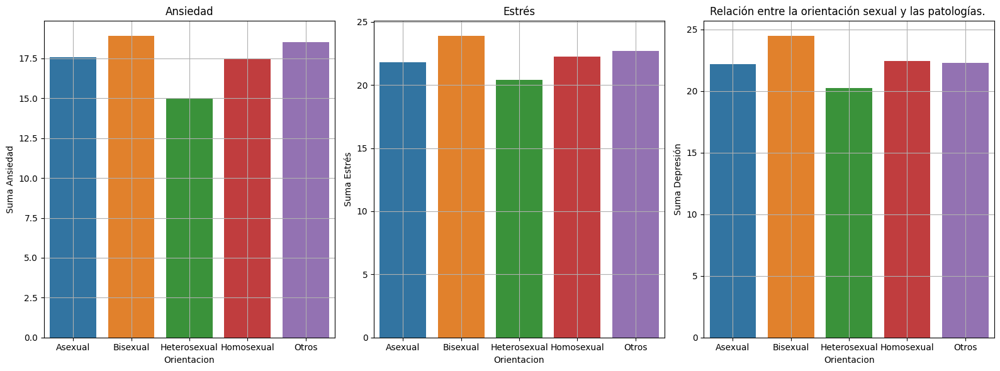

In [57]:
#Relación entre las patologías y la orientación sexual

fig, axes = plt.subplots(1, 3, figsize=(16, 6))
sns.barplot(data=media_A_orientacion, x='Orientacion', y='Suma Ansiedad', ax=axes[0], hue='Orientacion')
axes[0].set_title('Ansiedad')
axes[0].grid(True)

sns.barplot(data=media_E_orientacion, x='Orientacion', y='Suma Estrés', ax=axes[1], hue='Orientacion')
axes[1].set_title('Estrés')
axes[1].grid(True)

sns.barplot(data=media_D_orientacion, x='Orientacion', y='Suma Depresión', ax=axes[2], hue='Orientacion')
axes[2].set_title('Depresión')
axes[2].grid(True)

plt.tight_layout()
plt.title('Relación entre la orientación sexual y las patologías. ')
plt.show()

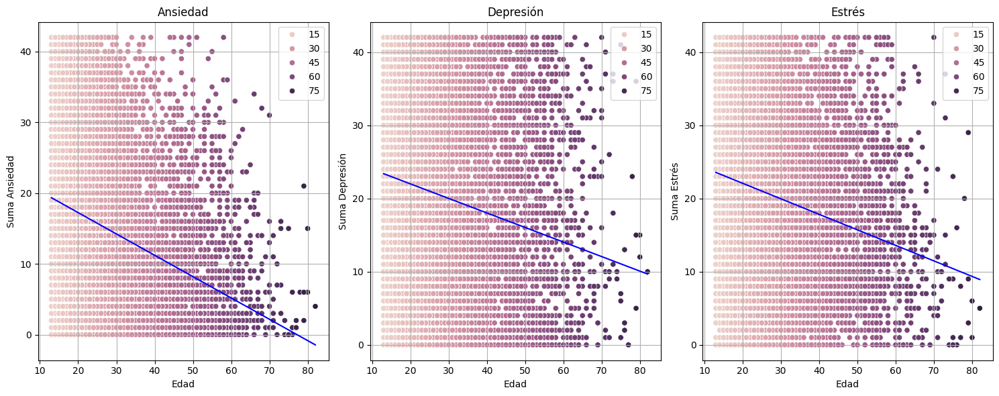

In [58]:
#Gráficos que relacionan la edad de las personas con la Ansiedad, Estrés y Depresión que padece:

fig, axes = plt.subplots(1, 3, figsize=(15, 6))

# Gráfico 1: Suma Ansiedad

sns.scatterplot(data=visualizacion, x='Edad', y='Suma Ansiedad', hue='Edad', ax=axes[0])
x = visualizacion['Edad']
y = visualizacion['Suma Ansiedad']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
xp = np.linspace(x.min(), x.max(), 100)
axes[0].plot(xp, p(xp), color='blue')

axes[0].set_title('Ansiedad')
axes[0].grid(True)
axes[0].legend(loc='upper right')

# Gráfico 2: Suma Depresión

sns.scatterplot(data=visualizacion, x='Edad', y='Suma Depresión', hue='Edad', ax=axes[1])
x = visualizacion['Edad']
y = visualizacion['Suma Depresión']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
xp = np.linspace(x.min(), x.max(), 100)
axes[1].plot(xp, p(xp), color='blue')

axes[1].set_title('Depresión')
axes[1].grid(True)
axes[1].legend(loc='upper right')

# Gráfico 3: Suma Estrés

sns.scatterplot(data=visualizacion, x='Edad', y='Suma Estrés', hue='Edad', ax=axes[2])
x = visualizacion['Edad']
y = visualizacion['Suma Estrés']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
xp = np.linspace(x.min(), x.max(), 100)
axes[2].plot(xp, p(xp), color='blue')

axes[2].set_title('Estrés')
axes[2].grid(True)
axes[2].legend(loc='upper right')


plt.tight_layout()
plt.show()

**Conclusión:**

Comparado con el estrés y la ansiedad, la depresión afecta en mayor medida a las personas mayores mientras que la ansiedad y el estrés se agudizan antes de cumplir 30 años.  

Se puede ver en el gráfico que las personas que no se identifican con género femenino ni masculino (color amarillo), están, en términos generales, en la escala más alta de los tres gráficos. 
En es siguiente gráfico se analiza en más profundidad la diferencia entre géneros: 

In [59]:
#Añadimos la variable del género a los gráficos que comparan la edad con las afecciones

media_ansiedad_por_orientacion = df_visualizaciones.groupby('Genero')['Suma Depresión'].mean().reset_index()

media_ansiedad_por_orientacion.rename(columns={'Suma Depresión': 'Media Suma Depresion'}, inplace=True)

df_visualizaciones2 = pd.merge(df_visualizaciones, media_ansiedad_por_orientacion, on='Genero', how='left')

In [60]:
#Gráficamos la ponderación de depresión por edad y género, observando que hay índices más altos de depresión en personas que no se ven reflejadas en los géneros binarios preestablecidos.

fig = px.area(
    data_frame=df_visualizaciones2,
    x="Edad",
    y="Media Suma Depresion",
    color="Genero",
    hover_name="Genero",
    hover_data=df_visualizaciones2.columns)

fig.update_layout(
    title="Media de Suma Depresión por Edad y Género",
    xaxis_title="Edad",
    yaxis_title="Media Suma Depresión")

fig.show()

**Conclusión:**

Comparado con el estrés y la ansiedad, la depresión afecta en mayor medida a las personas mayores mientras que la ansiedad y el estrés se agudizan antes de cumplir 30 años.  

Se puede ver en el gráfico que las personas que no se identifican con género femenino ni masculino son, por lo general más jóvenes y están en la parte más alta del gráfico dado que el porcentaje de depresión es mayor en esta categoría.


In [61]:

# Agrupamos por raza y orientación y calculamos la media de las 3 target

raza_A = df_visualizaciones.groupby(['Raza', 'Orientacion']).agg({'Suma Ansiedad': 'mean'}).reset_index()
raza_E = df_visualizaciones.groupby(['Raza', 'Orientacion']).agg({'Suma Estrés': 'mean'}).reset_index()
raza_D = df_visualizaciones.groupby(['Raza', 'Orientacion']).agg({'Suma Depresión': 'mean'}).reset_index()



In [62]:
fig1 = px.line(data_frame=raza_A,
              x="Raza",
              y="Suma Ansiedad",
              color="Orientacion",
              markers=True,
              color_discrete_sequence=px.colors.qualitative.Light24)

fig1.update_layout(
    title="Relación entre la Raza, la Orientación y la Media de Ansiedad",
    xaxis_title="Raza",
    yaxis_title="Media de Ansiedad",
    legend_title="Orientación",
    template="plotly_white")

#---------------------------------
fig2 = px.line(data_frame=raza_E,
              x="Raza",
              y="Suma Estrés",
              color="Orientacion",
              markers=True,
              color_discrete_sequence=px.colors.qualitative.Light24)

fig2.update_layout(
    title="Relación entre la Raza, la Orientación y la Media de Estrés",
    xaxis_title="Raza",
    yaxis_title="Media de Estrés",
    legend_title="Orientación",
    template="plotly_white")

#---------------------------------
fig3 = px.line(data_frame=raza_D,
              x="Raza",
              y="Suma Depresión",
              color="Orientacion",
              markers=True,
              color_discrete_sequence=px.colors.qualitative.Light24)

fig3.update_layout(
    title="Relación entre la Raza, la Orientación y la Media de Depresión",
    xaxis_title="Raza",
    yaxis_title="Media de Depresión",
    legend_title="Orientación",
    template="plotly_white"
)

fig1.show()
fig2.show()
fig3.show()

Con estros tres gráficos tan aclaratorios, vemos como la heterosexualidad, independientemente de la ascendencia étnica del individuo, es la orientación que menos se relaciona con las tres patologías.
También se puede ver que, independientemente de la orientación, las personas Nativo Americanas tienen más facilidad de sufrir alguno de los tres desordenes mentales.

In [63]:
#Ponderamos la columna de 'Zurdo' para un mejor análisis

media_A_mano = df_visualizaciones.groupby('Zurdo')['Suma Ansiedad'].mean().reset_index()
media_E_mano = df_visualizaciones.groupby('Zurdo')['Suma Estrés'].mean().reset_index()
media_D_mano= df_visualizaciones.groupby('Zurdo')['Suma Depresión'].mean().reset_index()
media_mano=pd.concat([(media_A_mano['Suma Ansiedad']),(media_E_mano['Suma Estrés']),media_D_mano], axis=1)

media_mano

,Suma Ansiedad,Suma Estrés,Zurdo,Suma Depresión
0,20.456053,24.238806,Ambidiestro,24.606965
1,16.163157,21.277447,Diestro,21.229381
2,16.491223,21.891536,Zurdo,21.848589


In [64]:
#Cambiamos las filas a columnas y viceversa para poder verlo en conjunto en un único gráfico

df_filas = pd.melt(media_mano, id_vars=['Zurdo'], value_vars=['Suma Ansiedad', 'Suma Estrés', 'Suma Depresión'],
                   var_name='Medida', value_name='Valor')

fig = px.line(df_filas,
              x='Zurdo',
              y='Valor',
              color='Medida',
              markers=True,
              color_discrete_sequence=px.colors.qualitative.Light24)

fig.update_layout(
    title="Comparación de Ansiedad, Estrés y Depresión según la dominancia de la mano",
    xaxis_title="Dominancia de mano",
    yaxis_title="Valor",
    legend_title="Medida",
    template="plotly_white"
)

# Mostrar el gráfico
fig.show()


**Conclusión** 

La gente ambidiestra, parece ser más propensa a padecer ansiedad, estrés y/o depresión. Esto puede deberse, entre otras cosas, a que, hace unos años la sociedad forzaba a las personas zurdas a utilizar la mano derecha. Esto puede dar lugar a mayor frustración desde niños.

Vemos también que las personas diestras son las que menos propensos son dado que la mayor parte de los objetos cotidianos están diseñados principalmente para diestros (tijeras, ratón PC, etc...). 

## Estudio por países

Vemos que la mayor parte de respuestas al **inventario de Beck** provienen de servidores de:

- Malasia
- EEUU
- Reino Unido
- Canada
- Indonesia
- Filipinas
- Australia
- India
- Alemania
- Singapur

In [65]:
fig4 = px.scatter_ternary(data_frame = df_visualizaciones,
                   a          = "Suma Ansiedad",
                   b          = "Suma Estrés",
                   c          = "Suma Depresión",
                   size       = "Edad",
                   color      = "country"
                  )

pais = 'US'
for trace in fig4.data:
     if trace.name != pais:
         trace.visible = 'legendonly'

fig4.update_layout(legend=dict(itemsizing='constant'))

fig4.show()

### Nivel de estrés/ansiedad/depresión por país

In [66]:
#Importamos las librerías necesarias para la visualización del mapamundi 

import geopandas as gpd
import pycountry

In [67]:

def get_country_name(code):
    try:
        return pycountry.countries.get(alpha_2=code).name
    except AttributeError:
        return None

# Convertimos códigos de país a nombres completos

df_visualizaciones['country_name'] = df_visualizaciones['country'].apply(get_country_name)
df_visualizaciones['country_name'] = df_visualizaciones['country_name'].replace({
    'United States': 'United States of America', 'Russian Federation': 'Russia', 
    'Dominican Republic': 'Dominican Rep.',
    'Türkiye': 'Turkey',
    'Korea, Republic of': 'South Korea',
    'Venezuela, Bolivarian Republic of': 'Venezuela',
    'Iran, Islamic Republic of': 'Iran',
    'Bolivia, Plurinational State of': 'Bolivia',
    'Palestine, State of': 'Palestine',
    'Taiwan, Province of China': 'Taiwan',
    'Tanzania, United Republic of': 'Tanzania',
    "Lao People's Democratic Republic": 'Laos',
    'Syrian Arab Republic': 'Syria',
    "Côte d'Ivoire": "Côte d'Ivoire",
    'Brunei Darussalam': 'Brunei',
    'Czechia': 'Czechia'})

# Verificamos los datos

print(df_visualizaciones[['country', 'country_name']].dropna().head())

  country              country_name
0      IN                     India
1      US  United States of America
2      PL                    Poland
3      US  United States of America
4      MY                  Malaysia


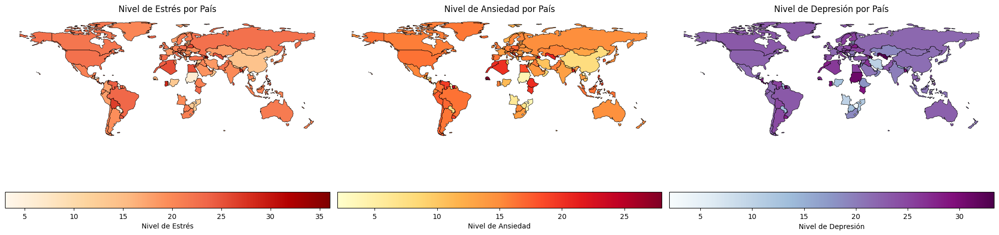

In [68]:
# Cargamos el mapa del mundo

mundo = gpd.read_file(r'ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp')

# Agrupamos los datos por país y calculamos el promedio de las columnas

df_grouped = df_visualizaciones.groupby('country_name').agg({
    'Suma Estrés': 'mean', 
    'Suma Ansiedad': 'mean', 
    'Suma Depresión': 'mean'}).reset_index()


df_grouped.rename(columns={
    'Suma Estrés': 'Estrés', 
    'Suma Ansiedad': 'Ansiedad', 
    'Suma Depresión': 'Depresión'}, inplace=True)

# Merge con el GeoDataFrame
mundo = mundo.merge(df_grouped, left_on='SOVEREIGNT', right_on='country_name', how='left')


fig, ax = plt.subplots(1, 3, figsize=(20, 7), sharex=True, sharey=True)


mundo.plot(column='Estrés', ax=ax[0], legend=True, cmap='OrRd', edgecolor='black', linewidth=0.5, legend_kwds={'label': "Nivel de Estrés", 'orientation': "horizontal"})
ax[0].set_title('Nivel de Estrés por País')
ax[0].set_axis_off()



mundo.plot(column='Ansiedad', ax=ax[1], legend=True, cmap='YlOrRd', edgecolor='black', linewidth=0.5, legend_kwds={'label': "Nivel de Ansiedad", 'orientation': "horizontal"})
ax[1].set_title('Nivel de Ansiedad por País')
ax[1].set_axis_off()



mundo.plot(column='Depresión', ax=ax[2], legend=True, cmap='BuPu', edgecolor='black', linewidth=0.5, legend_kwds={'label': "Nivel de Depresión", 'orientation': "horizontal"})
ax[2].set_title('Nivel de Depresión por País')
ax[2].set_axis_off()


plt.tight_layout()
plt.show()

In [69]:
#Ponderamos la columna de Licenciatura para un mejor análisis

media_A_licenciatura = df_visualizaciones.groupby('Licenciatura')['Suma Ansiedad'].mean().reset_index()
media_E_licenciatura = df_visualizaciones.groupby('Licenciatura')['Suma Estrés'].mean().reset_index()
media_D_licenciatura = df_visualizaciones.groupby('Licenciatura')['Suma Depresión'].mean().reset_index()

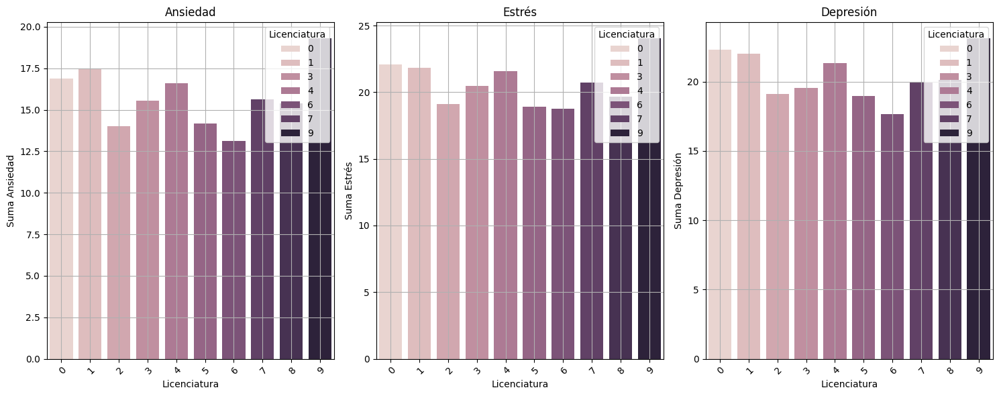

In [84]:
fig, axes = plt.subplots(1, 3, figsize=(15, 6))

# Gráfico 1: Suma Ansiedad
sns.barplot(data=media_A_licenciatura, x='Licenciatura', y='Suma Ansiedad', ax=axes[0], hue='Licenciatura')
axes[0].set_title('Ansiedad')
ticks = axes[0].get_xticks()
axes[0].set_xticks(ticks)
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
axes[0].grid(True)

# Gráfico 2: Suma Depresión
sns.barplot(data=media_E_licenciatura, x='Licenciatura', y='Suma Estrés', ax=axes[1], hue='Licenciatura')
axes[1].set_title('Estrés')
ticks = axes[1].get_xticks()
axes[1].set_xticks(ticks)
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
axes[1].grid(True)

# Gráfico 3: Suma Estrés
sns.barplot(data=media_D_licenciatura, x='Licenciatura', y='Suma Depresión', ax=axes[2], hue='Licenciatura')
axes[2].set_title('Depresión')
ticks = axes[2].get_xticks()
axes[2].set_xticks(ticks)
axes[2].set_xticklabels(axes[2].get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
axes[2].grid(True)


plt.tight_layout()
plt.show()

**Conclusion:**

Las personas cuya especialidad está relacionada con el turismo (-grupo 9-) son las más propensas a padecer alguna de las afecciones que estamos estudiando seguido por las personas que tienen estudios relacionados con el arte (-grupo 1-, segundo grupo con más ansiedad) o sin estudios(-grupo 0-). 

Las personas cuyos estudios se engloban en el ámbito de la medicina son las menos propensas a padecerlas. 



In [71]:
#Ponderamos la columna de Educacion para un mejor análisis

media_A_educacion = df_visualizaciones.groupby('Educacion')['Suma Ansiedad'].mean().reset_index()
media_E_educacion = df_visualizaciones.groupby('Educacion')['Suma Estrés'].mean().reset_index()
media_D_educacion = df_visualizaciones.groupby('Educacion')['Suma Depresión'].mean().reset_index()

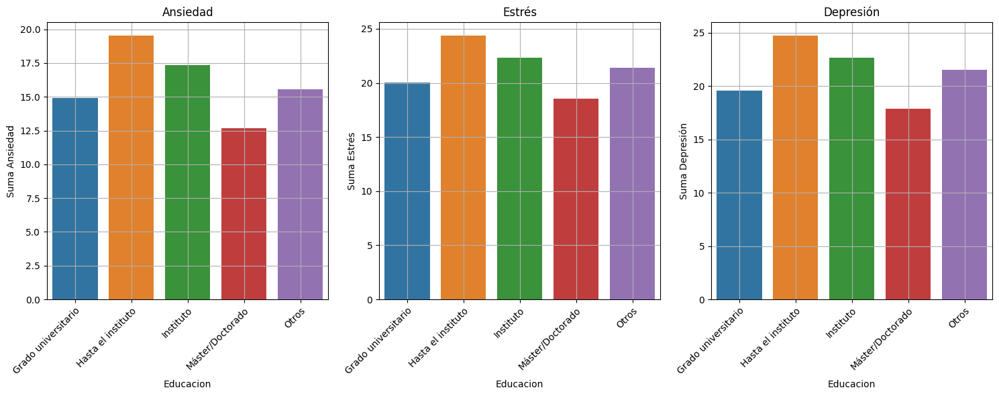

In [82]:
#Gráficos que estudian la relación entre el nivel de estudios y la posibilidad de padecer alguna de estas afecciones

fig, axes = plt.subplots(1, 3, figsize=(15, 6))

# Gráfico 1: Suma Ansiedad
sns.barplot(data=media_A_educacion, x='Educacion', y='Suma Ansiedad', ax=axes[0], hue='Educacion')
axes[0].set_title('Ansiedad')
ticks = axes[0].get_xticks()
axes[0].set_xticks(ticks)
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
axes[0].grid(True)

# Gráfico 2: Suma Depresión
sns.barplot(data=media_E_educacion, x='Educacion', y='Suma Estrés', ax=axes[1], hue='Educacion')
axes[1].set_title('Estrés')
ticks = axes[1].get_xticks()
axes[1].set_xticks(ticks)
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
axes[1].grid(True)

# Gráfico 3: Suma Estrés
sns.barplot(data=media_D_educacion, x='Educacion', y='Suma Depresión', ax=axes[2], hue='Educacion')
axes[2].set_title('Depresión')
ticks = axes[2].get_xticks()
axes[2].set_xticks(ticks)
axes[2].set_xticklabels(axes[2].get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
axes[2].grid(True)


plt.tight_layout()
plt.show()

**Conclusión:**

Podemos observar en este gráfico que, a medida que aumenta el nivel de estudios (Grado Universitario, doctores, etc...), las personas son menos propensas a padecer ansiedad, estrés o depresión. Quizá esto se deba a la posibilidad de acceder a puestos cuya calidad de vida es mayor que los trabajos menos especializados. 

Las personas más propensas son las que han dejado sus estudios antes o durante el instituto por el mismo motivo, los puestos a los que acceden conllevan menos calidad de vida, menor salario... 

In [73]:
#Ponderamos la columna de Familia para un mejor análisis

media_A_familia = df_visualizaciones.groupby('Familia')['Suma Ansiedad'].mean().reset_index()
media_E_familia = df_visualizaciones.groupby('Familia')['Suma Estrés'].mean().reset_index()
media_D_familia = df_visualizaciones.groupby('Familia')['Suma Depresión'].mean().reset_index()

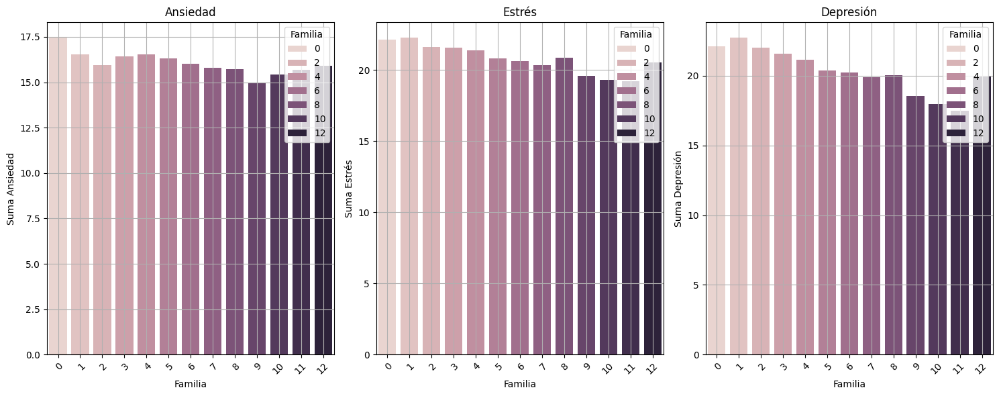

In [81]:
#Gráficos que muestran la relación entre dichas afecciones y el tamaño del núcleo familiar

fig, axes = plt.subplots(1, 3, figsize=(15, 6))

# Gráfico 1: Suma Ansiedad
sns.barplot(data=media_A_familia, x='Familia', y='Suma Ansiedad', ax=axes[0], hue='Familia')
axes[0].set_title('Ansiedad')
ticks = axes[0].get_xticks()
axes[0].set_xticks(ticks)
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
axes[0].grid(True)

# Gráfico 2: Suma Depresión
sns.barplot(data=media_E_familia, x='Familia', y='Suma Estrés', ax=axes[1], hue='Familia')
axes[1].set_title('Estrés')
ticks = axes[1].get_xticks()
axes[1].set_xticks(ticks)
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
axes[1].grid(True)

# Gráfico 3: Suma Estrés
sns.barplot(data=media_D_familia, x='Familia', y='Suma Depresión', ax=axes[2], hue='Familia')
axes[2].set_title('Depresión')
ticks = axes[2].get_xticks()
axes[2].set_xticks(ticks)
axes[2].set_xticklabels(axes[2].get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
axes[2].grid(True)


plt.tight_layout()
plt.show()

## Gráficos que relacionan las afecciones con los constructos

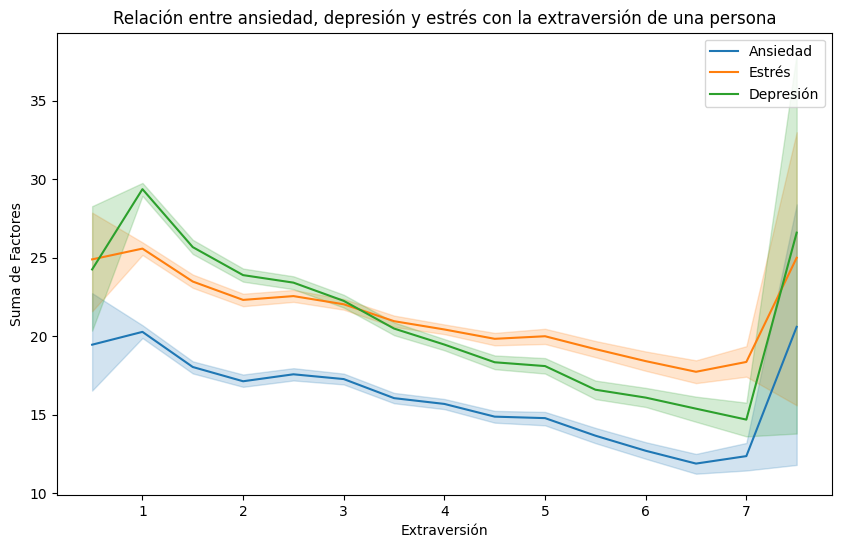

In [75]:
plt.figure(figsize=(10, 6))

sns.lineplot(data=df_visualizaciones, x='EXTRAVERSIÓN', y='Suma Ansiedad', label= 'Ansiedad')
sns.lineplot(data=df_visualizaciones, x='EXTRAVERSIÓN', y='Suma Estrés', label= 'Estrés')
sns.lineplot(data=df_visualizaciones, x='EXTRAVERSIÓN', y='Suma Depresión', label='Depresión')

plt.title('Relación entre ansiedad, depresión y estrés con la extraversión de una persona')
plt.xlabel('Extraversión')
plt.ylabel('Suma de Factores')
plt.legend()
plt.show()

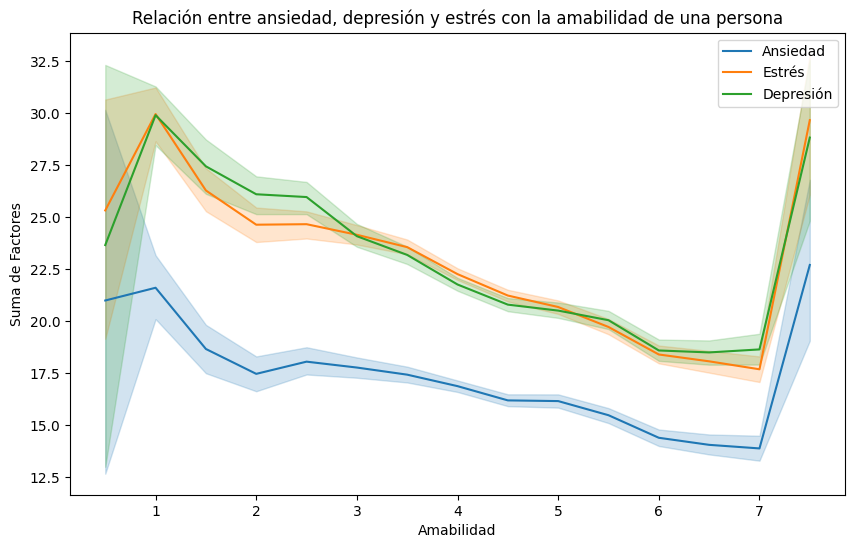

In [76]:
plt.figure(figsize=(10, 6))

sns.lineplot(data=df_visualizaciones, x='AMABILIDAD', y='Suma Ansiedad', label= 'Ansiedad')
sns.lineplot(data=df_visualizaciones, x='AMABILIDAD', y='Suma Estrés', label= 'Estrés')
sns.lineplot(data=df_visualizaciones, x='AMABILIDAD', y='Suma Depresión', label='Depresión')

plt.title('Relación entre ansiedad, depresión y estrés con la amabilidad de una persona')
plt.xlabel('Amabilidad')
plt.ylabel('Suma de Factores')
plt.legend()
plt.show()

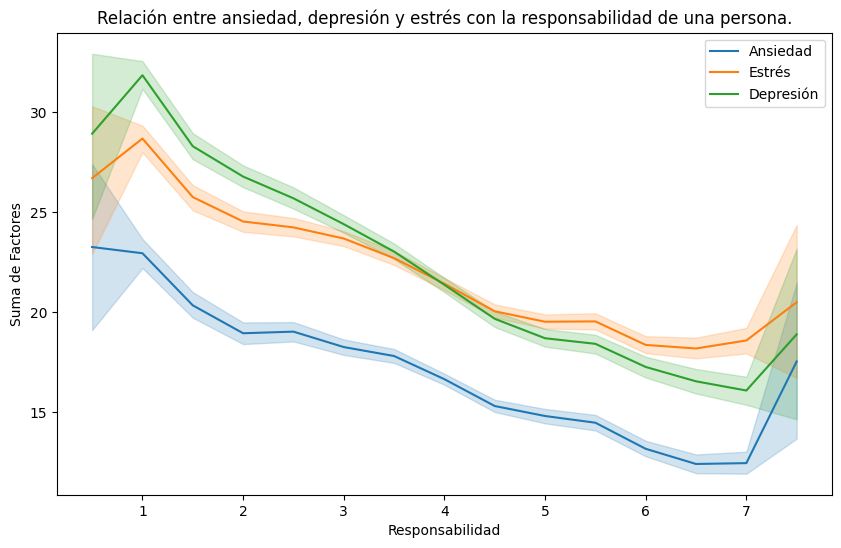

In [77]:
plt.figure(figsize=(10, 6))

sns.lineplot(data=df_visualizaciones, x='RESPONSABILIDAD', y='Suma Ansiedad', label= 'Ansiedad')
sns.lineplot(data=df_visualizaciones, x='RESPONSABILIDAD', y='Suma Estrés', label= 'Estrés')
sns.lineplot(data=df_visualizaciones, x='RESPONSABILIDAD', y='Suma Depresión', label='Depresión')

plt.title('Relación entre ansiedad, depresión y estrés con la responsabilidad de una persona.')
plt.xlabel('Responsabilidad')
plt.ylabel('Suma de Factores')
plt.legend()
plt.show()

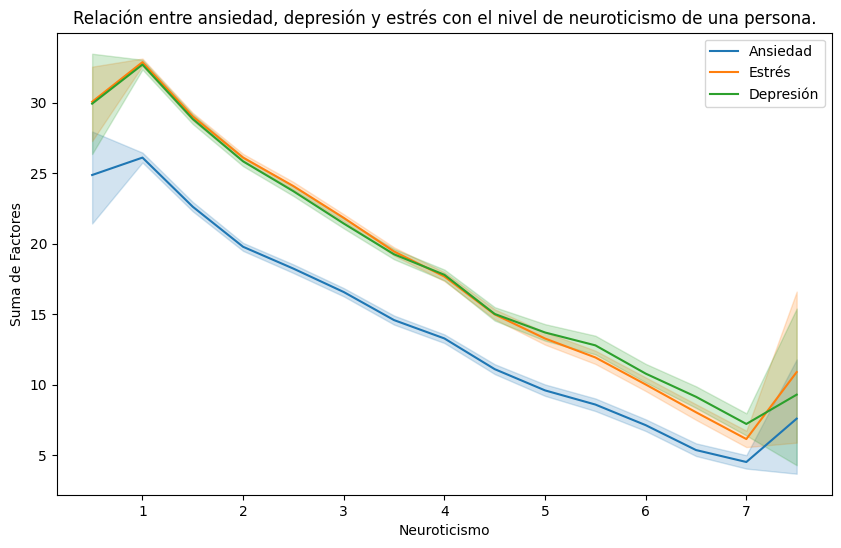

In [78]:
plt.figure(figsize=(10, 6))

sns.lineplot(data=df_visualizaciones, x='NEUROTICISMO', y='Suma Ansiedad', label= 'Ansiedad')
sns.lineplot(data=df_visualizaciones, x='NEUROTICISMO', y='Suma Estrés', label= 'Estrés')
sns.lineplot(data=df_visualizaciones, x='NEUROTICISMO', y='Suma Depresión', label='Depresión')

plt.title('Relación entre ansiedad, depresión y estrés con el nivel de neuroticismo de una persona.')
plt.xlabel('Neuroticismo')
plt.ylabel('Suma de Factores')
plt.legend()
plt.show()

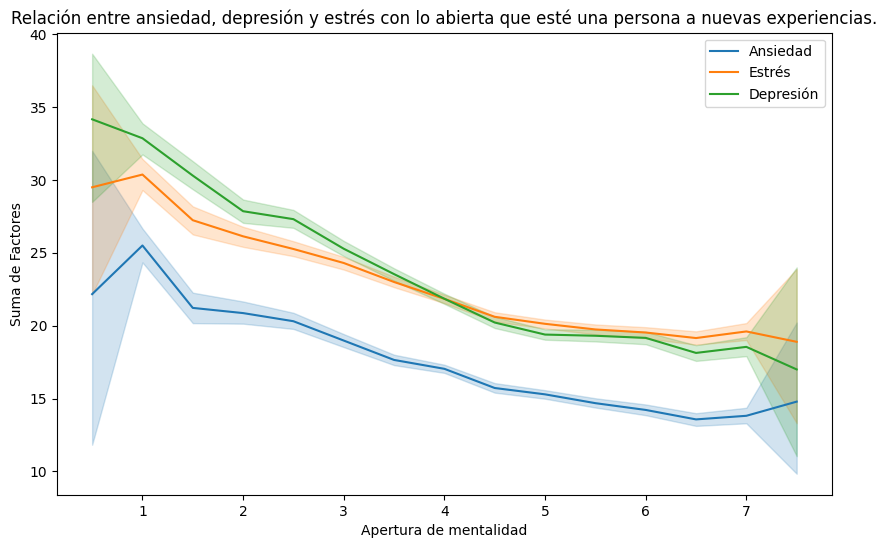

In [79]:
plt.figure(figsize=(10, 6))

sns.lineplot(data=df_visualizaciones, x='APERTURA EXP', y='Suma Ansiedad', label= 'Ansiedad')
sns.lineplot(data=df_visualizaciones, x='APERTURA EXP', y='Suma Estrés', label= 'Estrés')
sns.lineplot(data=df_visualizaciones, x='APERTURA EXP', y='Suma Depresión', label='Depresión')

plt.title('Relación entre ansiedad, depresión y estrés con lo abierta que esté una persona a nuevas experiencias.')
plt.xlabel('Apertura de mentalidad')
plt.ylabel('Suma de Factores')
plt.legend()
plt.show()

- Trabajo realizado con mucho cariño y arte por:

    - Paula
    - Nadine
    - Miguel
    - Isma